<a href="https://colab.research.google.com/github/lorenzlorg/MSc-Thesis-CV/blob/main/1_OBJ_DET_TRACK_YOLOv7_SORT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**OBJECT DETECTION (YOLOv7) + OBJECT TRACKING (SORT)**

Questo notebook permette di eseguire l'operazione di object detection e tracking sui video a disposizione utilizzando per YOLOv7 i pesi ottenuti dalla fase di training eseguita nel notebook precedente.


**Reference:**

https://github.com/RizwanMunawar/yolov7-object-tracking 

In [ ]:
AGGIUNGERE ULTIMI GRAFICI DA https://colab.research.google.com/drive/1_lfq1f6lZcSnIsCKC6rKWWPrqGnNwZ7P?authuser=2

# Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount ("/content/drive")

Mounted at /content/drive


# Clone the YOLOv7 Object Tracking Code

In [ ]:
!git clone https://github.com/RizwanMunawar/yolov7-object-tracking.git
%cd "yolov7-object-tracking"
!pip install -r requirements.txt
!pip install yt-dlp

Cloning into 'yolov7-object-tracking'...
remote: Enumerating objects: 200, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 200 (delta 58), reused 49 (delta 49), pack-reused 135
Receiving objects: 100% (200/200), 156.08 KiB | 2.74 MiB/s, done.
Resolving deltas: 100% (98/98), done.
/content/yolov7-object-tracking
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.4/408.4 KB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 KB 21.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 78.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 113.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 77.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 113.4 MB/s eta 0:00:00


In [ ]:
%cd /content/yolov7-object-tracking

/content/yolov7-object-tracking


**--------------> Aggiornare script detect_and_track /content/yolov7-object-tracking/detect_and_track.py - https://drive.google.com/file/d/1e1MYssXVeZE0CyeyFzBCXSPGiOiaP7MG/view?usp=share_link**

# Detect and Track (Person Class)

**conf-thres**: will help in reducing false detection with lower conf score if your model is trained well. But will result in missing out some of the detections if your acc is not that good. The confidence threshold defines the minimum confidence value at which the detection must be kept.
By default, if a detection has a confidence threshold lower than 25%, it will be deleted.

**iou-thres**: if your samples are too close to each other that you want to detect then lowering it beyond a certain level will result in inaccurate bounding boxes. Con bassi valori avremo dunque delle bounding box non accurate

Noi siamo nel caso in cui vogliamo più pedoni possibili (quindi accettiamo anche false detection, quindi abbassiamo la soglia **conf-thres**) stabilendo comunque un valore massimo (in utils-general.py riga 620 max detections) ma di queste detection vogliamo delle bounding box corrette (quindi non abbassiamo la soglia **iou-thres**), tenendo in considerazione anche che queste saranno molto vicino tra esse, quindi più precisi siamo meglio è. Per questo motivo teniamo il valore di default.

Vedi issue che avevo aperto in merito a ciò.

In [ ]:
# test con pesi non addestrati

# !python detect_and_track.py \
# --weights /content/drive/MyDrive/yolov7x.pt \
# --no-download \
# --source /content/drive/MyDrive/SkylineWebcams_dataset/milan_2021-07-15_14_59_31.mp4 \
# --img-size 1920 \
# --conf-thres 0.10 \
# --iou-thres 0.45 \
# --device 0 \
# --save-txt \
# --save-conf \
# --classes 0 

In [ ]:
# test con pesi addestrati

!python detect_and_track.py \
--weights /content/drive/MyDrive/yolov7_best_100epoche.pt \
--no-download \
--source /content/drive/MyDrive/video_Duomo/milan_2021-07-15_07_59_31.mp4 \
--img-size 1920 \
--conf-thres 0.10 \
--iou-thres 0.45 \
--device 0 \
--save-txt \
--save-conf \
--classes 3 
# --save-bbox-dim  # non necessario

# frequenza dei fotogrammi è pari a: 15.01 fotogrammi/secondo

# nel testing su CGMU ho usato:
# conf-thres 0.001 
# iou-thres 0.65

# default 
# conf-thres: 0.25
# iou-thres: 0.45

# test su Milano
# 0.45 iou-thres: fisso, si mantiene questo valore
# 0.25 conf-thres -> 230 persone 
# 0.15 conf-thres -> 260 persone 
# 0.10 conf-thres -> 280 persone <----------------------------------------------
# 0.05 conf-thres -> 300 persone fisse -> perchè c'è come limite max 300 persone
# 0.01 conf-thres -> 300 persone fisse
# https://github.com/RizwanMunawar/yolov7-object-tracking/blob/155302a1b5b987ccba8fbd07f3c4bf01b426e3bc/utils/general.py#L620 - limite numero detections

# versione finale
# conf-thres: 0.10
# iou-thres: 0.45

# duomo2sec: 3.765s 
# duomo10sec: 19.270s
# milan_2021-07-15_07_59_31.mp4: 40 min 

Namespace(agnostic_nms=False, augment=False, classes=[3], colored_trk=False, conf_thres=0.1, device='0', download=False, exist_ok=False, img_size=1920, iou_thres=0.45, name='object_tracking', no_trace=False, nosave=False, project='runs/detect', save_bbox_dim=False, save_conf=True, save_txt=True, source='/content/drive/MyDrive/video_Duomo/milan_2021-07-15_07_59_31.mp4', update=False, view_img=False, weights=['/content/drive/MyDrive/yolov7_best_100epoche.pt'])
YOLOR 🚀 yolov7-object-tracking-42-g8ee00d6 torch 1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536.125MB)

Fusing layers... 
IDetect.fuse
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 362 layers, 70809396 parameters, 0 gradients, 188.1 GFLOPS
 Convert model

In [ ]:
# per salvataggio video con detection
!cp /content/yolov7-object-tracking/runs/detect/object_tracking/milan_2021-07-15_17_59_31.mp4 /content/drive/MyDrive

# Test per visualizzare una detection

In [ ]:
# per visulizzare una particolare detection

# import cv2
# input_video_path = "/content/drive/MyDrive/milano2min.mp4"
# cap = cv2.VideoCapture(input_video_path)
# frame_no = 0
# cap.set(1,frame_no)  # Where frame_no is the frame you want
# ret, frame = cap.read()  # Read the frame
# # cv2.imshow('window_name', frame)  # show frame on window
# image = cv2.circle(frame, (   334,	944), radius=0, color=(255, 0, 0), thickness=3)
# cv2.imwrite("/content/7.png", image)

True

# Unione dei fari file (per ogni frame viene generato un file txt contenente le detection, noi vogliamo un file unico)

In [ ]:
# per unire i vari file

from os import walk

filenames = next(walk('/content/yolov7-object-tracking/runs/detect/object_tracking/labels'), (None, None, []))[2] 

%cd /content/yolov7-object-tracking/runs/detect/object_tracking/labels


with open('/content/yolov7-object-tracking/detection_milan_2021-07-15_17_59_31.txt', 'w') as outfile:
    for fname in filenames:
        with open(fname) as infile:
            for line in infile:
                outfile.write(line)

/content/yolov7-object-tracking/runs/detect/object_tracking/labels


In [ ]:
!cp /content/yolov7-object-tracking/detection_milan_2021-07-15_17_59_31.txt /content/drive/MyDrive

In [ ]:
# salvataggio risultati non ordinati per frame
import pandas as pd
data = pd.read_csv('/content/yolov7-object-tracking/detection_milan_2021-07-15_17_59_31.txt', sep=' ', header=None)
data.head()

,0,1,2,3,4
0,9530,72000,364.5,882.0,0
1,9530,82596,555.0,797.0,0
2,9530,83082,442.0,783.0,0
3,9530,83657,230.5,749.0,0
4,9530,83803,286.0,786.0,0


# Ordinamento delle righe per frame e id_pedestrian

In [ ]:
# data = pd.read_csv('/content/yolov7-object-tracking/detection_milan_2021-07-15_14_59_31.txt', sep=' ', header=None)
# data.head()

,0,1,2,3,4
0,735,160,759.0,765.0,0
1,735,697,594.5,759.0,0
2,735,919,1374.0,826.0,0
3,735,1397,1417.0,780.0,0
4,735,1775,562.0,762.0,0


In [ ]:
data = data.rename({0: 'frame', 
                     1: 'id_pedestrian',
                     2: 'x',
                     3: 'y',
                     4: 'class',},  axis=1)
# se salvo anche dimensioni bounding box
# data = data.rename({0: 'frame', 
#                      1: 'id_pedestrian',
#                      2: 'x',
#                      3: 'y',
#                      4: 'class',
#                      5: 'width',
#                      6: 'height'},  axis=1)
data.head()

,frame,id_pedestrian,x,y,class
0,9530,72000,364.5,882.0,0
1,9530,82596,555.0,797.0,0
2,9530,83082,442.0,783.0,0
3,9530,83657,230.5,749.0,0
4,9530,83803,286.0,786.0,0


In [ ]:
# ordinamento per frame e id_pedestrian
sorted_df = data.sort_values(by=['frame', 'id_pedestrian'], ascending=True)
sorted_df.head()

,frame,id_pedestrian,x,y,class
4878744,1,0,928.0,1025.0,0
4878745,1,1,1367.0,826.0,0
4878746,1,2,1018.5,1010.0,0
4878747,1,3,1447.0,919.0,0
4878748,1,4,1431.0,916.0,0


# Salvataggio risultati ordinati

In [ ]:
# salvataggio risultati ordinati per frame
sorted_df.to_csv(r'/content/yolov7-object-tracking/detection_milan_2021-07-15_17_59_31_ordered.txt', header=None, index=None, sep=' ', mode='a')

In [ ]:
!cp /content/yolov7-object-tracking/detection_milan_2021-07-15_17_59_31_ordered.txt /content/drive/MyDrive

# Visualizzazione detections

## Visualizzazione tracce pulite su frame video

In [ ]:
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/detections_YOLOv7_SORT/milan_2021-07-15_07_59_31/Copia di detection_milan_2021-07-15_07_59_31_ordered.txt', sep='\t', header=None)
sorted_df = data.copy(deep=True)
sorted_df = sorted_df.rename({0: 'frame', 
                     1: 'id',
                     2: 'x',
                     3: 'y',
                     4: 'class',},  axis=1)

sorted_df

,frame,id,x,y,class
0,1,0,816.0,958.0,0
1,1,1,458.0,832.0,0
2,1,2,493.5,760.0,0
3,1,3,568.0,830.0,0
4,1,4,1671.0,912.0,0
...,...,...,...,...,...
2351819,27873,54406,561.0,655.0,0
2351820,27873,54407,316.5,896.0,0
2351821,27873,54408,308.5,695.0,0
2351822,27873,54409,504.0,754.0,0


In [ ]:
# dati traiettorie pre processate
import pandas as pd
traj_8 = pd.read_csv('/content/drive/MyDrive/dataframe_trajectories/dataframe_08.csv')  
traj_8['id'] = traj_8['id'].str.replace('08_', '')
traj_8 = traj_8[['frame', 'id', 'lon', 'lat']]
traj_8['id'] = traj_8['id'].astype(int)
traj_8

,frame,id,lon,lat
0,15,16,514789.988391,5.034519e+06
1,30,16,514789.988391,5.034519e+06
2,45,16,514789.988391,5.034519e+06
3,60,16,514789.988391,5.034519e+06
4,75,16,514789.988391,5.034519e+06
...,...,...,...,...
7961,27810,53754,514817.100953,5.034592e+06
7962,27825,53754,514817.100953,5.034592e+06
7963,27840,53754,514817.100953,5.034592e+06
7964,27855,53754,514817.100953,5.034592e+06


In [ ]:
# delle traiettorie pulite mi salvo le coordinate x e y per essere in grado di plottarle sul frame
join_df = pd.merge(sorted_df, traj_8,  how='right', on=['frame','id'])
join_df

,frame,id,x,y,class,lon,lat
0,15,16,1368.0,910.0,0,514789.988391,5.034519e+06
1,30,16,1367.0,910.0,0,514789.988391,5.034519e+06
2,45,16,1367.0,910.0,0,514789.988391,5.034519e+06
3,60,16,1367.0,910.0,0,514789.988391,5.034519e+06
4,75,16,1367.0,910.0,0,514789.988391,5.034519e+06
...,...,...,...,...,...,...,...
7961,27810,53754,82.5,778.0,0,514817.100953,5.034592e+06
7962,27825,53754,82.5,778.0,0,514817.100953,5.034592e+06
7963,27840,53754,82.5,778.0,0,514817.100953,5.034592e+06
7964,27855,53754,82.5,778.0,0,514817.100953,5.034592e+06


In [ ]:
join_df = join_df.sort_values(by=['frame', 'id'], ascending=True)
datatemp = join_df.copy(deep=True)
datatemp['x'] = datatemp['x'].astype(int)
datatemp['y'] = datatemp['y'].astype(int)
datatemp

,frame,id,x,y,class,lon,lat
0,15,16,1368,910,0,514789.988391,5.034519e+06
1,30,16,1367,910,0,514789.988391,5.034519e+06
2,45,16,1367,910,0,514789.988391,5.034519e+06
3,60,16,1367,910,0,514789.988391,5.034519e+06
4,75,16,1367,910,0,514789.988391,5.034519e+06
...,...,...,...,...,...,...,...
7961,27810,53754,82,778,0,514817.100953,5.034592e+06
7962,27825,53754,82,778,0,514817.100953,5.034592e+06
7963,27840,53754,82,778,0,514817.100953,5.034592e+06
7964,27855,53754,82,778,0,514817.100953,5.034592e+06


In [ ]:
# genero per ogni traiettoria un colore univoco
rgb = []

for r in range(0,256,1):
 for g in range(0,256,1):
  for b in range(0,256,1):
    rgb.append([r,g,b])

import random
lista = random.sample(list(rgb), datatemp['id'].nunique())  # seleziono n = datatemp['id'].nunique() colroi univoci, tanti quanti sono gli id delle traiettorie

# assegno ad ongi id un colore univoco
test = pd.DataFrame(datatemp['id'].unique())
test['color'] = None

for index, row in test.iterrows():
  row['color'] = (1,2,3)

test["color"] = test.apply(lambda x: (1,2,3), axis=1)
test["color"] = lista
test = test.rename({0: 'id', },  axis=1)
test

,id,color
0,16,"[87, 121, 237]"
1,169,"[115, 165, 12]"
2,192,"[254, 96, 34]"
3,347,"[200, 222, 189]"
4,443,"[238, 30, 122]"
...,...,...
250,52249,"[34, 71, 243]"
251,52452,"[81, 39, 150]"
252,52501,"[103, 203, 21]"
253,53479,"[84, 4, 234]"


In [ ]:
# aggiungo ai dati precedenti la feature colore

datatemp_new = pd.merge(datatemp, test,  how='left', on='id')
datatemp_new

,frame,id,x,y,class,lon,lat,color
0,15,16,1368,910,0,514789.988391,5.034519e+06,"[67, 14, 49]"
1,30,16,1367,910,0,514789.988391,5.034519e+06,"[67, 14, 49]"
2,45,16,1367,910,0,514789.988391,5.034519e+06,"[67, 14, 49]"
3,60,16,1367,910,0,514789.988391,5.034519e+06,"[67, 14, 49]"
4,75,16,1367,910,0,514789.988391,5.034519e+06,"[67, 14, 49]"
...,...,...,...,...,...,...,...,...
7961,27810,53754,82,778,0,514817.100953,5.034592e+06,"[3, 113, 128]"
7962,27825,53754,82,778,0,514817.100953,5.034592e+06,"[3, 113, 128]"
7963,27840,53754,82,778,0,514817.100953,5.034592e+06,"[3, 113, 128]"
7964,27855,53754,82,778,0,514817.100953,5.034592e+06,"[3, 113, 128]"


In [ ]:
some_values = datatemp['frame'].unique()  # sorted_df['frame'].unique()  # [30,31,32,33,34,35]

import cv2
input_video_path = "/content/drive/MyDrive/video_Duomo/milan_2021-07-15_07_59_31.mp4"

for frame in some_values:
  cap = cv2.VideoCapture(input_video_path)
  frame_no = frame
  cap.set(1,frame_no)  # Where frame_no is the frame you want
  ret, frame = cap.read()  # Read the frame
  # cv2.imshow('window_name', frame)  # show frame on window

  for index, row in datatemp_new.iterrows():
    image = cv2.circle(frame, (int(row['x']),	int(row['y'])), radius=0, color=row['color'], thickness=3)

  cv2.imwrite("/content/test0.png", image)

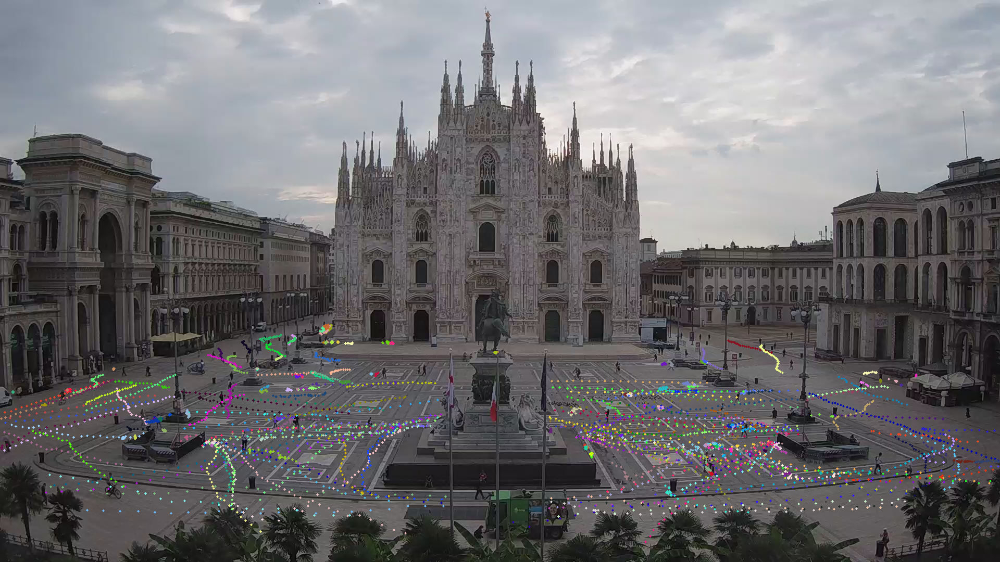

In [ ]:
from IPython.display import display, Image
display(Image(filename='/content/test0.png'))

## Visualizzazione detection points

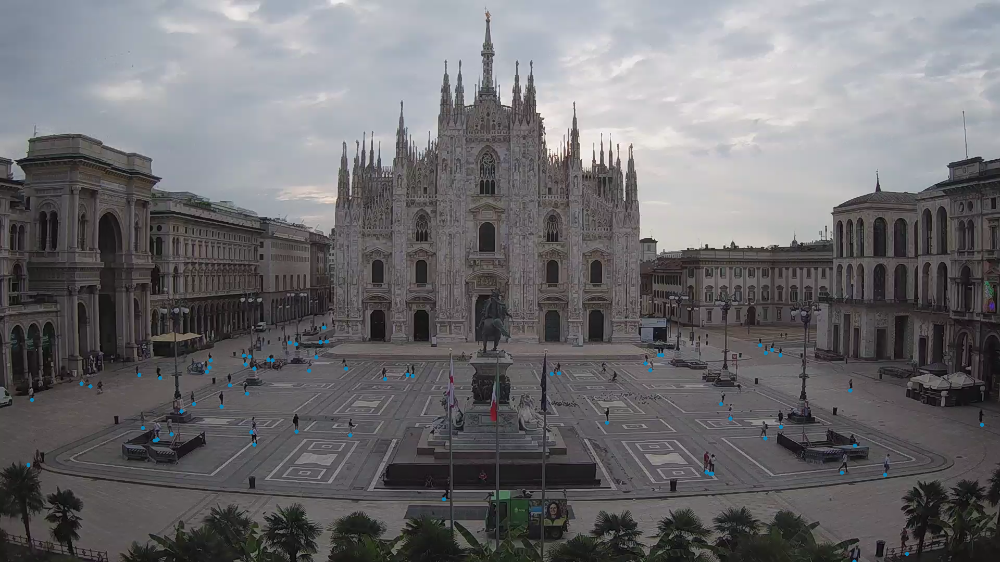

In [ ]:
# seleziono un frame in maniera arbitraria

datatemp = sorted_df.copy(deep=True)
datatemp = datatemp[datatemp['frame']==19]
datatemp['x'] = datatemp['x'].astype(int)
datatemp['y'] = datatemp['y'].astype(int)
datatemp

# visualizzazione detection frame scelto in maniera arbitraria
import cv2
input_video_path = "/content/drive/MyDrive/video_Duomo/milan_2021-07-15_07_59_31.mp4"
cap = cv2.VideoCapture(input_video_path)
frame_no = 20
cap.set(1,frame_no)  # Where frame_no is the frame you want
ret, frame = cap.read()  # Read the frame
# cv2.imshow('window_name', frame)  # show frame on window

for index, row in datatemp.iterrows():
  image = cv2.circle(frame, (   row['x'],	row['y']), radius=0, color=(184, 134, 11), thickness=8)

cv2.imwrite("/content/test1.png", image)

from IPython.display import display, Image
display(Image(filename='/content/test1.png'))

## Visualizzazione tracce pedoni

<ipython-input-23-4b2f8b618aed>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datatemp['x'] = datatemp['x'].astype(int)
<ipython-input-23-4b2f8b618aed>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datatemp['y'] = datatemp['y'].astype(int)


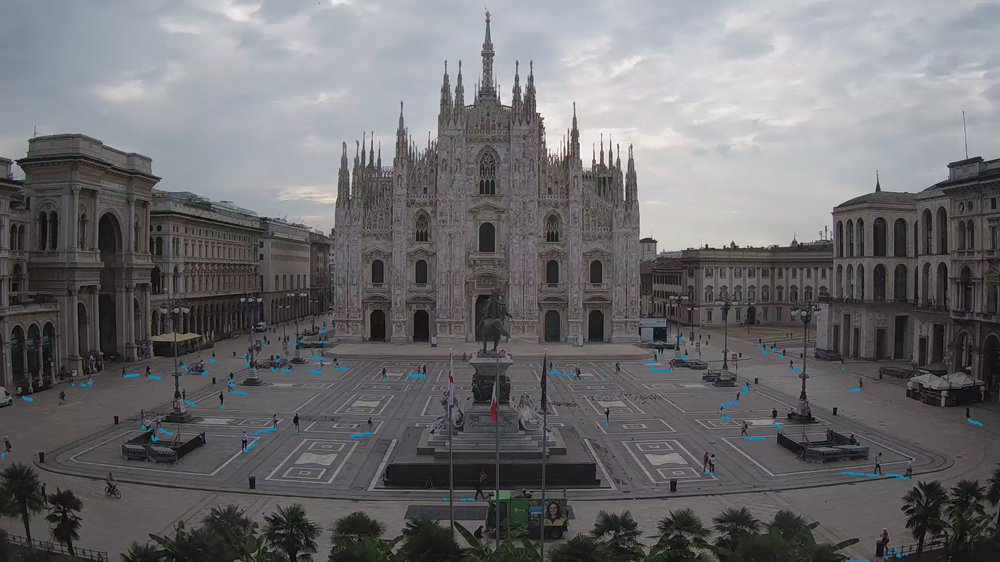

In [ ]:
# visualizzazione detections su un arco di frames

some_values = list(range(20,50))  # sorted_df['frame'].unique()  # [30,31,32,33,34,35]
datatemp = sorted_df.loc[sorted_df['frame'].isin(some_values)]
datatemp['x'] = datatemp['x'].astype(int)
datatemp['y'] = datatemp['y'].astype(int)

import cv2
input_video_path = "/content/drive/MyDrive/video_Duomo/milan_2021-07-15_07_59_31.mp4"

for frame in some_values:
  cap = cv2.VideoCapture(input_video_path)
  frame_no = frame
  cap.set(1,frame_no)  # Where frame_no is the frame you want
  ret, frame = cap.read()  # Read the frame
  # cv2.imshow('window_name', frame)  # show frame on window

  for index, row in datatemp.iterrows():
    image = cv2.circle(frame, (row['x'],	row['y']), radius=0, color=(184, 134, 11), thickness=3)

  cv2.imwrite("/content/test2.png", image)

from IPython.display import display, Image
display(Image(filename='/content/test2.png'))

# Alcune analisi

In [ ]:
# è necessario salvare le dimensioni delle bounding box
# altezza media delle bounding box
data["height"].mean()

In [ ]:
# nei frame analizzati vengono individuati 537 pedoni univoici
sorted_df['id_pedestrian'].nunique()